In [5]:
from datautils import *
from vae import *

# Model Training and Latent Extraction

In [2]:
RS_csv_path = "RS_example.csv"

### Dataset Generation for Later Use In Generating Latents from Trained Models

In [3]:
non_data_cols = ['Age', 'Sex']

In [4]:
# Dataset with both control and PTSD subjects for generating latents 
# after training
both_RS_dataset = generate_datasets(RS_csv_path, dataset_type='RS', non_data_cols=non_data_cols, patient_type='control_ptsd', randomize=False, scale_features='robust', fill_empty="zero")
trans = transforms.Compose([GaussianNoise(0, 0.1, both_RS_dataset.brain_columns), ToTorchFormat()])
both_RS_dataset.transform = trans

C:\Users\Orren\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3418: DtypeWarning: Columns (1) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)
C:\Users\Orren\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3418: DtypeWarning: Columns (1,4) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


### Dataset Generation For Training On Control

In [5]:
# Train test split
tt_split = 0.8
# Amt of training data to set aside for validation
val_split = 0.2

# RS

# For loading the control resting state dataset
train_control_RS_dataset, val_control_RS_dataset, test_control_RS_dataset = \
generate_datasets(RS_csv_path, dataset_type='RS', non_data_cols=non_data_cols, 
                  patient_type='control', train_test_split=True, 
                  percent_split=tt_split, validation_split=val_split, 
                  randomize=True, scale_features='robust', fill_empty="zero")


# Transforms need to be applied after the dataset is generated since GaussianNoise requires the brain_columns of the dataset
trans = transforms.Compose([GaussianNoise(0, 0.1, train_control_RS_dataset.brain_columns), ToTorchFormat()])
train_control_RS_dataset.transform = trans
val_control_RS_dataset.transform = trans
test_control_RS_dataset.transform = trans

# For loading the PTSD RS dataset for training validation
PTSD_RS_dataset = generate_datasets(RS_csv_path, dataset_type='RS', non_data_cols=non_data_cols, patient_type='PTSD', 
                                    randomize=True, scale_features='robust', fill_empty="zero")
# Transforms need to be applied after the dataset is generated since GaussianNoise requires the brain_columns of the dataset
trans = transforms.Compose([GaussianNoise(0, 0.1, PTSD_RS_dataset.brain_columns), ToTorchFormat()])
PTSD_RS_dataset.transform = trans

C:\Users\Orren\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3418: DtypeWarning: Columns (1) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)
C:\Users\Orren\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3418: DtypeWarning: Columns (1,4) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)
C:\Users\Orren\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3418: DtypeWarning: Columns (1) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)
C:\Users\Orren\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3418: DtypeWarning: Columns (1,4) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [6]:
train_dataset = train_control_RS_dataset
val_dataset = val_control_RS_dataset
test_dataset = test_control_RS_dataset

In [7]:
print(PTSD_RS_dataset[0])

{'data': tensor([-1.0469, -0.8522, -0.7398,  ...,  0.3752, -0.9158, -0.5814]), 'diagnosis': tensor([1]), 'info': {'Site': 'WesternOntario', 'SubjectID': '4005'}, 'clinical': {'Site': 'WesternOntario', 'SubjectID': '4005', 'Diagnosis': 1.0, 'Age': 56.0, 'Sex': 0.0}, 'data_noisy': tensor([-0.8779, -0.8324, -0.7089,  ...,  0.2964, -0.8551, -0.5355])}


### Training Model on Control and Extracting Latents

In [8]:
hidden_sizes = [400]
latent_sizes = [10]
betas = [1]
l2s = [0.1]
learning_rates = [1e-3]

activations = ('tanh', 'selu', 'tanh', 'tanh')

epochs = 500

for hidden_size in hidden_sizes:
    for latent_size in latent_sizes:
        for beta in betas:
            for l2 in l2s:
                for learning_rate in learning_rates:
                    # This is simply our naming convention as it easily facilitates multiple iterations and
                    # varying parameters
                    net_name = 'control_{}_l{}_h{}_b{}_test'.format('RS', latent_size, hidden_size, beta)

                    stats_list = ["epoch", "loss", "loss_per_feature", "validation_loss", "validation_loss_per_feature"]
                    
                    # Will train the net for the given epochs, save the loss each epoch, and validation will be performed
                    # on specified datasets in the validation parameter.
                    train_net(net_name, train_dataset, num_epochs=epochs, until=epochs, 
                              hidden_size=hidden_size, latent_size=latent_size, 
                              activations=activations, beta=beta, l2=l2, learning_rate=learning_rate,
                              load_net=False, overwrite=True, overwrite_log=True, stats_list=stats_list, 
                              validation=[val_dataset, PTSD_RS_dataset])

                    # Post training validation on test dataset and PTSD dataset
                    validation(net_name, test_dataset, overwrite_log=True) 
                    validation(net_name, PTSD_RS_dataset)

                    extract_latents(net_name, both_RS_dataset, fname_tag='both')

Training Network 'control_RS_l10_h400_b1_test'
Train Epoch: 0
Train Epoch: 0 [0/941 (0%)]	Loss: 23199.675781	Loss Per Feature 0.668270
Train Epoch: 0 [128/941 (12%)]	Loss: 27426.968750	Loss Per Feature 0.790038
Train Epoch: 0 [256/941 (25%)]	Loss: 25276.277344	Loss Per Feature 0.728087
Train Epoch: 0 [384/941 (38%)]	Loss: 22966.199219	Loss Per Feature 0.661545
Train Epoch: 0 [512/941 (50%)]	Loss: 23423.775391	Loss Per Feature 0.674726
Train Epoch: 0 [640/941 (62%)]	Loss: 21065.855469	Loss Per Feature 0.606805
Train Epoch: 0 [768/941 (75%)]	Loss: 20817.808594	Loss Per Feature 0.599660
Train Epoch: 0 [315/941 (88%)]	Loss: 19767.320312	Loss Per Feature 0.569401
====> Epoch: 0 Average Loss: 22992.985107	Average Loss Per Feature 0.662317
Saving model to  vae_nets\control_RS_l10_h400_b1_test\control_RS_l10_h400_b1_test_0.nn
Performing validation on model 'control_RS_l10_h400_b1_test'
[0/234 (0%)]	Loss: 19039.306641	Loss Per Feature 0.548430
[64/234 (25%)]	Loss: 20221.988281	Loss Per Feature 

[512/1001 (50%)]	Loss: 21806.134766	Loss Per Feature 0.628129
[576/1001 (56%)]	Loss: 19073.552734	Loss Per Feature 0.549417
[640/1001 (62%)]	Loss: 18470.777344	Loss Per Feature 0.532054
[704/1001 (69%)]	Loss: 20016.677734	Loss Per Feature 0.576584
[768/1001 (75%)]	Loss: 19401.384766	Loss Per Feature 0.558860
[832/1001 (81%)]	Loss: 22128.800781	Loss Per Feature 0.637424
[896/1001 (88%)]	Loss: 18445.673828	Loss Per Feature 0.531331
[615/1001 (94%)]	Loss: 21110.218750	Loss Per Feature 0.608083
Average Loss: 20089.026611	Average Loss Per Feature 0.578668
Train Epoch: 4
Train Epoch: 4 [0/941 (0%)]	Loss: 19153.158203	Loss Per Feature 0.551710
Train Epoch: 4 [128/941 (12%)]	Loss: 19033.437500	Loss Per Feature 0.548261
Train Epoch: 4 [256/941 (25%)]	Loss: 18665.253906	Loss Per Feature 0.537656
Train Epoch: 4 [384/941 (38%)]	Loss: 20038.240234	Loss Per Feature 0.577205
Train Epoch: 4 [512/941 (50%)]	Loss: 19532.091797	Loss Per Feature 0.562625
Train Epoch: 4 [640/941 (62%)]	Loss: 18474.681641	L

[64/1001 (6%)]	Loss: 19748.812500	Loss Per Feature 0.568868
[128/1001 (12%)]	Loss: 19232.968750	Loss Per Feature 0.554009
[192/1001 (19%)]	Loss: 21059.087891	Loss Per Feature 0.606610
[256/1001 (25%)]	Loss: 19220.259766	Loss Per Feature 0.553643
[320/1001 (31%)]	Loss: 19755.376953	Loss Per Feature 0.569057
[384/1001 (38%)]	Loss: 20648.828125	Loss Per Feature 0.594793
[448/1001 (44%)]	Loss: 19873.353516	Loss Per Feature 0.572455
[512/1001 (50%)]	Loss: 21541.833984	Loss Per Feature 0.620516
[576/1001 (56%)]	Loss: 18859.525391	Loss Per Feature 0.543252
[640/1001 (62%)]	Loss: 18164.351562	Loss Per Feature 0.523227
[704/1001 (69%)]	Loss: 19735.642578	Loss Per Feature 0.568488
[768/1001 (75%)]	Loss: 19152.259766	Loss Per Feature 0.551684
[832/1001 (81%)]	Loss: 21867.330078	Loss Per Feature 0.629892
[896/1001 (88%)]	Loss: 18071.173828	Loss Per Feature 0.520543
[615/1001 (94%)]	Loss: 20541.402344	Loss Per Feature 0.591698
Average Loss: 19776.129150	Average Loss Per Feature 0.569655
Train Epoch

[0/234 (0%)]	Loss: 17234.722656	Loss Per Feature 0.496449
[64/234 (25%)]	Loss: 18046.576172	Loss Per Feature 0.519835
[128/234 (50%)]	Loss: 17781.449219	Loss Per Feature 0.512198
[126/234 (75%)]	Loss: 20955.806641	Loss Per Feature 0.603635
Average Loss: 18504.638672	Average Loss Per Feature 0.533029
Performing validation on model 'control_RS_l10_h400_b1_test'
[0/1001 (0%)]	Loss: 18869.035156	Loss Per Feature 0.543526
[64/1001 (6%)]	Loss: 19752.597656	Loss Per Feature 0.568977
[128/1001 (12%)]	Loss: 19098.068359	Loss Per Feature 0.550123
[192/1001 (19%)]	Loss: 20852.595703	Loss Per Feature 0.600662
[256/1001 (25%)]	Loss: 19068.021484	Loss Per Feature 0.549257
[320/1001 (31%)]	Loss: 19668.681641	Loss Per Feature 0.566560
[384/1001 (38%)]	Loss: 20606.113281	Loss Per Feature 0.593562
[448/1001 (44%)]	Loss: 19706.476562	Loss Per Feature 0.567648
[512/1001 (50%)]	Loss: 21342.638672	Loss Per Feature 0.614778
[576/1001 (56%)]	Loss: 18756.064453	Loss Per Feature 0.540271
[640/1001 (62%)]	Loss: 

Train Epoch: 15 [512/941 (50%)]	Loss: 17098.158203	Loss Per Feature 0.492515
Train Epoch: 15 [640/941 (62%)]	Loss: 18793.236328	Loss Per Feature 0.541342
Train Epoch: 15 [768/941 (75%)]	Loss: 16719.183594	Loss Per Feature 0.481599
Train Epoch: 15 [315/941 (88%)]	Loss: 17310.146484	Loss Per Feature 0.498622
====> Epoch: 15 Average Loss: 17930.724365	Average Loss Per Feature 0.516497
Performing validation on model 'control_RS_l10_h400_b1_test'
[0/234 (0%)]	Loss: 16929.570312	Loss Per Feature 0.487659
[64/234 (25%)]	Loss: 17834.042969	Loss Per Feature 0.513712
[128/234 (50%)]	Loss: 17526.970703	Loss Per Feature 0.504867
[126/234 (75%)]	Loss: 20760.515625	Loss Per Feature 0.598010
Average Loss: 18262.774902	Average Loss Per Feature 0.526062
Performing validation on model 'control_RS_l10_h400_b1_test'
[0/1001 (0%)]	Loss: 18824.494141	Loss Per Feature 0.542243
[64/1001 (6%)]	Loss: 19747.255859	Loss Per Feature 0.568823
[128/1001 (12%)]	Loss: 18986.236328	Loss Per Feature 0.546902
[192/1001 (

[896/1001 (88%)]	Loss: 18020.041016	Loss Per Feature 0.519070
[615/1001 (94%)]	Loss: 20366.687500	Loss Per Feature 0.586666
Average Loss: 19605.288208	Average Loss Per Feature 0.564734
Train Epoch: 19
Train Epoch: 19 [0/941 (0%)]	Loss: 17391.056641	Loss Per Feature 0.500952
Train Epoch: 19 [128/941 (12%)]	Loss: 18456.947266	Loss Per Feature 0.531655
Train Epoch: 19 [256/941 (25%)]	Loss: 17273.205078	Loss Per Feature 0.497557
Train Epoch: 19 [384/941 (38%)]	Loss: 17437.908203	Loss Per Feature 0.502302
Train Epoch: 19 [512/941 (50%)]	Loss: 16236.186523	Loss Per Feature 0.467686
Train Epoch: 19 [640/941 (62%)]	Loss: 17889.843750	Loss Per Feature 0.515320
Train Epoch: 19 [768/941 (75%)]	Loss: 17520.859375	Loss Per Feature 0.504691
Train Epoch: 19 [315/941 (88%)]	Loss: 18685.251953	Loss Per Feature 0.538232
====> Epoch: 19 Average Loss: 17611.407349	Average Loss Per Feature 0.507299
Performing validation on model 'control_RS_l10_h400_b1_test'
[0/234 (0%)]	Loss: 16770.445312	Loss Per Feature

[320/1001 (31%)]	Loss: 19637.882812	Loss Per Feature 0.565672
[384/1001 (38%)]	Loss: 20499.621094	Loss Per Feature 0.590495
[448/1001 (44%)]	Loss: 19696.591797	Loss Per Feature 0.567364
[512/1001 (50%)]	Loss: 21391.515625	Loss Per Feature 0.616186
[576/1001 (56%)]	Loss: 18765.722656	Loss Per Feature 0.540550
[640/1001 (62%)]	Loss: 18175.449219	Loss Per Feature 0.523547
[704/1001 (69%)]	Loss: 19535.943359	Loss Per Feature 0.562736
[768/1001 (75%)]	Loss: 18953.404297	Loss Per Feature 0.545956
[832/1001 (81%)]	Loss: 21771.160156	Loss Per Feature 0.627122
[896/1001 (88%)]	Loss: 18010.626953	Loss Per Feature 0.518799
[615/1001 (94%)]	Loss: 20484.802734	Loss Per Feature 0.590068
Average Loss: 19654.820435	Average Loss Per Feature 0.566160
Train Epoch: 23
Train Epoch: 23 [0/941 (0%)]	Loss: 16963.804688	Loss Per Feature 0.488645
Train Epoch: 23 [128/941 (12%)]	Loss: 15975.008789	Loss Per Feature 0.460163
Train Epoch: 23 [256/941 (25%)]	Loss: 17607.279297	Loss Per Feature 0.507181
Train Epoch: 

[126/234 (75%)]	Loss: 19864.125000	Loss Per Feature 0.572189
Average Loss: 17654.509277	Average Loss Per Feature 0.508541
Performing validation on model 'control_RS_l10_h400_b1_test'
[0/1001 (0%)]	Loss: 19027.373047	Loss Per Feature 0.548087
[64/1001 (6%)]	Loss: 19937.677734	Loss Per Feature 0.574308
[128/1001 (12%)]	Loss: 18982.941406	Loss Per Feature 0.546807
[192/1001 (19%)]	Loss: 20928.205078	Loss Per Feature 0.602840
[256/1001 (25%)]	Loss: 19258.464844	Loss Per Feature 0.554743
[320/1001 (31%)]	Loss: 19746.587891	Loss Per Feature 0.568804
[384/1001 (38%)]	Loss: 20609.064453	Loss Per Feature 0.593647
[448/1001 (44%)]	Loss: 19933.146484	Loss Per Feature 0.574178
[512/1001 (50%)]	Loss: 21472.625000	Loss Per Feature 0.618522
[576/1001 (56%)]	Loss: 18997.699219	Loss Per Feature 0.547232
[640/1001 (62%)]	Loss: 18296.078125	Loss Per Feature 0.527021
[704/1001 (69%)]	Loss: 19700.646484	Loss Per Feature 0.567480
[768/1001 (75%)]	Loss: 18975.095703	Loss Per Feature 0.546581
[832/1001 (81%)]

Train Epoch: 30 [768/941 (75%)]	Loss: 16689.287109	Loss Per Feature 0.480738
Train Epoch: 30 [315/941 (88%)]	Loss: 16981.052734	Loss Per Feature 0.489142
====> Epoch: 30 Average Loss: 16012.104370	Average Loss Per Feature 0.461231
Saving model to  vae_nets\control_RS_l10_h400_b1_test\control_RS_l10_h400_b1_test_30.nn
Performing validation on model 'control_RS_l10_h400_b1_test'
[0/234 (0%)]	Loss: 16348.658203	Loss Per Feature 0.470926
[64/234 (25%)]	Loss: 16947.494141	Loss Per Feature 0.488175
[128/234 (50%)]	Loss: 17040.480469	Loss Per Feature 0.490854
[126/234 (75%)]	Loss: 19704.148438	Loss Per Feature 0.567581
Average Loss: 17510.195312	Average Loss Per Feature 0.504384
Performing validation on model 'control_RS_l10_h400_b1_test'
[0/1001 (0%)]	Loss: 19197.812500	Loss Per Feature 0.552996
[64/1001 (6%)]	Loss: 20040.923828	Loss Per Feature 0.577282
[128/1001 (12%)]	Loss: 19037.251953	Loss Per Feature 0.548371
[192/1001 (19%)]	Loss: 21077.197266	Loss Per Feature 0.607132
[256/1001 (25%)

[615/1001 (94%)]	Loss: 20878.542969	Loss Per Feature 0.601410
Average Loss: 20027.996582	Average Loss Per Feature 0.576910
Train Epoch: 34
Train Epoch: 34 [0/941 (0%)]	Loss: 14991.276367	Loss Per Feature 0.431826
Train Epoch: 34 [128/941 (12%)]	Loss: 14595.452148	Loss Per Feature 0.420424
Train Epoch: 34 [256/941 (25%)]	Loss: 15169.478516	Loss Per Feature 0.436959
Train Epoch: 34 [384/941 (38%)]	Loss: 15066.708008	Loss Per Feature 0.433999
Train Epoch: 34 [512/941 (50%)]	Loss: 16251.482422	Loss Per Feature 0.468127
Train Epoch: 34 [640/941 (62%)]	Loss: 16112.858398	Loss Per Feature 0.464133
Train Epoch: 34 [768/941 (75%)]	Loss: 15374.789062	Loss Per Feature 0.442873
Train Epoch: 34 [315/941 (88%)]	Loss: 14834.071289	Loss Per Feature 0.427298
====> Epoch: 34 Average Loss: 15299.514526	Average Loss Per Feature 0.440705
Performing validation on model 'control_RS_l10_h400_b1_test'
[0/234 (0%)]	Loss: 16188.852539	Loss Per Feature 0.466323
[64/234 (25%)]	Loss: 16651.640625	Loss Per Feature 0

[448/1001 (44%)]	Loss: 20227.156250	Loss Per Feature 0.582647
[512/1001 (50%)]	Loss: 21959.291016	Loss Per Feature 0.632541
[576/1001 (56%)]	Loss: 19368.621094	Loss Per Feature 0.557916
[640/1001 (62%)]	Loss: 18780.474609	Loss Per Feature 0.540975
[704/1001 (69%)]	Loss: 19993.011719	Loss Per Feature 0.575902
[768/1001 (75%)]	Loss: 19416.884766	Loss Per Feature 0.559307
[832/1001 (81%)]	Loss: 22156.326172	Loss Per Feature 0.638217
[896/1001 (88%)]	Loss: 18660.257812	Loss Per Feature 0.537512
[615/1001 (94%)]	Loss: 20968.123047	Loss Per Feature 0.603990
Average Loss: 20172.265503	Average Loss Per Feature 0.581065
Train Epoch: 38
Train Epoch: 38 [0/941 (0%)]	Loss: 14768.206055	Loss Per Feature 0.425401
Train Epoch: 38 [128/941 (12%)]	Loss: 14506.422852	Loss Per Feature 0.417860
Train Epoch: 38 [256/941 (25%)]	Loss: 14952.486328	Loss Per Feature 0.430709
Train Epoch: 38 [384/941 (38%)]	Loss: 14762.004883	Loss Per Feature 0.425222
Train Epoch: 38 [512/941 (50%)]	Loss: 14402.037109	Loss Per 

[0/1001 (0%)]	Loss: 19596.812500	Loss Per Feature 0.564489
[64/1001 (6%)]	Loss: 20604.328125	Loss Per Feature 0.593511
[128/1001 (12%)]	Loss: 19478.625000	Loss Per Feature 0.561085
[192/1001 (19%)]	Loss: 21517.941406	Loss Per Feature 0.619828
[256/1001 (25%)]	Loss: 19855.166016	Loss Per Feature 0.571931
[320/1001 (31%)]	Loss: 20324.578125	Loss Per Feature 0.585453
[384/1001 (38%)]	Loss: 21236.109375	Loss Per Feature 0.611710
[448/1001 (44%)]	Loss: 20358.908203	Loss Per Feature 0.586442
[512/1001 (50%)]	Loss: 22067.289062	Loss Per Feature 0.635652
[576/1001 (56%)]	Loss: 19636.910156	Loss Per Feature 0.565644
[640/1001 (62%)]	Loss: 18945.667969	Loss Per Feature 0.545733
[704/1001 (69%)]	Loss: 20227.320312	Loss Per Feature 0.582651
[768/1001 (75%)]	Loss: 19534.029297	Loss Per Feature 0.562681
[832/1001 (81%)]	Loss: 22372.708984	Loss Per Feature 0.644450
[896/1001 (88%)]	Loss: 18809.527344	Loss Per Feature 0.541811
[615/1001 (94%)]	Loss: 21155.027344	Loss Per Feature 0.609374
Average Loss:

[0/234 (0%)]	Loss: 16030.354492	Loss Per Feature 0.461757
[64/234 (25%)]	Loss: 16220.546875	Loss Per Feature 0.467235
[128/234 (50%)]	Loss: 16651.019531	Loss Per Feature 0.479635
[126/234 (75%)]	Loss: 18928.865234	Loss Per Feature 0.545249
Average Loss: 16957.696533	Average Loss Per Feature 0.488469
Performing validation on model 'control_RS_l10_h400_b1_test'
[0/1001 (0%)]	Loss: 19736.998047	Loss Per Feature 0.568527
[64/1001 (6%)]	Loss: 20547.662109	Loss Per Feature 0.591879
[128/1001 (12%)]	Loss: 19623.367188	Loss Per Feature 0.565254
[192/1001 (19%)]	Loss: 21551.527344	Loss Per Feature 0.620795
[256/1001 (25%)]	Loss: 19971.775391	Loss Per Feature 0.575290
[320/1001 (31%)]	Loss: 20440.998047	Loss Per Feature 0.588806
[384/1001 (38%)]	Loss: 21206.011719	Loss Per Feature 0.610843
[448/1001 (44%)]	Loss: 20593.523438	Loss Per Feature 0.593200
[512/1001 (50%)]	Loss: 22202.802734	Loss Per Feature 0.639555
[576/1001 (56%)]	Loss: 19733.068359	Loss Per Feature 0.568414
[640/1001 (62%)]	Loss: 

Train Epoch: 49 [512/941 (50%)]	Loss: 13141.483398	Loss Per Feature 0.378543
Train Epoch: 49 [640/941 (62%)]	Loss: 13692.419922	Loss Per Feature 0.394412
Train Epoch: 49 [768/941 (75%)]	Loss: 12763.298828	Loss Per Feature 0.367649
Train Epoch: 49 [315/941 (88%)]	Loss: 14658.316406	Loss Per Feature 0.422235
====> Epoch: 49 Average Loss: 13721.699829	Average Loss Per Feature 0.395256
Performing validation on model 'control_RS_l10_h400_b1_test'
[0/234 (0%)]	Loss: 15892.680664	Loss Per Feature 0.457791
[64/234 (25%)]	Loss: 16045.221680	Loss Per Feature 0.462185
[128/234 (50%)]	Loss: 16598.304688	Loss Per Feature 0.478117
[126/234 (75%)]	Loss: 18747.720703	Loss Per Feature 0.540031
Average Loss: 16820.981934	Average Loss Per Feature 0.484531
Performing validation on model 'control_RS_l10_h400_b1_test'
[0/1001 (0%)]	Loss: 19909.802734	Loss Per Feature 0.573505
[64/1001 (6%)]	Loss: 20774.750000	Loss Per Feature 0.598420
[128/1001 (12%)]	Loss: 19656.798828	Loss Per Feature 0.566217
[192/1001 (

[832/1001 (81%)]	Loss: 22615.097656	Loss Per Feature 0.651432
[896/1001 (88%)]	Loss: 19037.980469	Loss Per Feature 0.548392
[615/1001 (94%)]	Loss: 21582.537109	Loss Per Feature 0.621688
Average Loss: 20665.567993	Average Loss Per Feature 0.595275
Train Epoch: 53
Train Epoch: 53 [0/941 (0%)]	Loss: 13380.650391	Loss Per Feature 0.385432
Train Epoch: 53 [128/941 (12%)]	Loss: 13387.915039	Loss Per Feature 0.385641
Train Epoch: 53 [256/941 (25%)]	Loss: 12918.413086	Loss Per Feature 0.372117
Train Epoch: 53 [384/941 (38%)]	Loss: 13020.192383	Loss Per Feature 0.375049
Train Epoch: 53 [512/941 (50%)]	Loss: 12928.348633	Loss Per Feature 0.372403
Train Epoch: 53 [640/941 (62%)]	Loss: 14182.836914	Loss Per Feature 0.408539
Train Epoch: 53 [768/941 (75%)]	Loss: 13428.922852	Loss Per Feature 0.386822
Train Epoch: 53 [315/941 (88%)]	Loss: 12935.159180	Loss Per Feature 0.372599
====> Epoch: 53 Average Loss: 13272.804810	Average Loss Per Feature 0.382325
Performing validation on model 'control_RS_l10_

[320/1001 (31%)]	Loss: 20770.583984	Loss Per Feature 0.598300
[384/1001 (38%)]	Loss: 21598.013672	Loss Per Feature 0.622134
[448/1001 (44%)]	Loss: 20797.431641	Loss Per Feature 0.599073
[512/1001 (50%)]	Loss: 22599.734375	Loss Per Feature 0.650989
[576/1001 (56%)]	Loss: 20052.228516	Loss Per Feature 0.577608
[640/1001 (62%)]	Loss: 19340.373047	Loss Per Feature 0.557103
[704/1001 (69%)]	Loss: 20558.277344	Loss Per Feature 0.592185
[768/1001 (75%)]	Loss: 19927.640625	Loss Per Feature 0.574019
[832/1001 (81%)]	Loss: 22753.433594	Loss Per Feature 0.655416
[896/1001 (88%)]	Loss: 19278.371094	Loss Per Feature 0.555317
[615/1001 (94%)]	Loss: 21624.480469	Loss Per Feature 0.622897
Average Loss: 20767.888672	Average Loss Per Feature 0.598222
Train Epoch: 57
Train Epoch: 57 [0/941 (0%)]	Loss: 13485.718750	Loss Per Feature 0.388458
Train Epoch: 57 [128/941 (12%)]	Loss: 12846.017578	Loss Per Feature 0.370032
Train Epoch: 57 [256/941 (25%)]	Loss: 12859.526367	Loss Per Feature 0.370421
Train Epoch: 

[128/234 (50%)]	Loss: 16455.798828	Loss Per Feature 0.474012
[126/234 (75%)]	Loss: 18480.664062	Loss Per Feature 0.532339
Average Loss: 16595.579834	Average Loss Per Feature 0.478038
Performing validation on model 'control_RS_l10_h400_b1_test'
[0/1001 (0%)]	Loss: 20132.460938	Loss Per Feature 0.579919
[64/1001 (6%)]	Loss: 21090.876953	Loss Per Feature 0.607526
[128/1001 (12%)]	Loss: 19924.746094	Loss Per Feature 0.573936
[192/1001 (19%)]	Loss: 22121.892578	Loss Per Feature 0.637225
[256/1001 (25%)]	Loss: 20466.402344	Loss Per Feature 0.589538
[320/1001 (31%)]	Loss: 20900.001953	Loss Per Feature 0.602028
[384/1001 (38%)]	Loss: 21831.269531	Loss Per Feature 0.628853
[448/1001 (44%)]	Loss: 20917.271484	Loss Per Feature 0.602525
[512/1001 (50%)]	Loss: 22634.535156	Loss Per Feature 0.651991
[576/1001 (56%)]	Loss: 20097.365234	Loss Per Feature 0.578908
[640/1001 (62%)]	Loss: 19511.445312	Loss Per Feature 0.562030
[704/1001 (69%)]	Loss: 20709.037109	Loss Per Feature 0.596527
[768/1001 (75%)]	

Train Epoch: 64 [640/941 (62%)]	Loss: 12201.909180	Loss Per Feature 0.351478
Train Epoch: 64 [768/941 (75%)]	Loss: 12423.645508	Loss Per Feature 0.357865
Train Epoch: 64 [315/941 (88%)]	Loss: 11070.121094	Loss Per Feature 0.318877
====> Epoch: 64 Average Loss: 12410.507080	Average Loss Per Feature 0.357487
Performing validation on model 'control_RS_l10_h400_b1_test'
[0/234 (0%)]	Loss: 15700.532227	Loss Per Feature 0.452256
[64/234 (25%)]	Loss: 15545.364258	Loss Per Feature 0.447787
[128/234 (50%)]	Loss: 16389.513672	Loss Per Feature 0.472103
[126/234 (75%)]	Loss: 18410.382812	Loss Per Feature 0.530314
Average Loss: 16511.448242	Average Loss Per Feature 0.475615
Performing validation on model 'control_RS_l10_h400_b1_test'
[0/1001 (0%)]	Loss: 20283.855469	Loss Per Feature 0.584280
[64/1001 (6%)]	Loss: 21213.587891	Loss Per Feature 0.611061
[128/1001 (12%)]	Loss: 20109.023438	Loss Per Feature 0.579244
[192/1001 (19%)]	Loss: 22229.812500	Loss Per Feature 0.640333
[256/1001 (25%)]	Loss: 205

Train Epoch: 68 [0/941 (0%)]	Loss: 12206.987305	Loss Per Feature 0.351624
Train Epoch: 68 [128/941 (12%)]	Loss: 12655.365234	Loss Per Feature 0.364540
Train Epoch: 68 [256/941 (25%)]	Loss: 11710.330078	Loss Per Feature 0.337318
Train Epoch: 68 [384/941 (38%)]	Loss: 11608.966797	Loss Per Feature 0.334398
Train Epoch: 68 [512/941 (50%)]	Loss: 12613.732422	Loss Per Feature 0.363341
Train Epoch: 68 [640/941 (62%)]	Loss: 12374.130859	Loss Per Feature 0.356439
Train Epoch: 68 [768/941 (75%)]	Loss: 12729.563477	Loss Per Feature 0.366677
Train Epoch: 68 [315/941 (88%)]	Loss: 13059.178711	Loss Per Feature 0.376172
====> Epoch: 68 Average Loss: 12369.781860	Average Loss Per Feature 0.356314
Performing validation on model 'control_RS_l10_h400_b1_test'
[0/234 (0%)]	Loss: 15614.551758	Loss Per Feature 0.449780
[64/234 (25%)]	Loss: 15545.417969	Loss Per Feature 0.447788
[128/234 (50%)]	Loss: 16400.019531	Loss Per Feature 0.472405
[126/234 (75%)]	Loss: 18240.201172	Loss Per Feature 0.525412
Average L

[512/1001 (50%)]	Loss: 22983.923828	Loss Per Feature 0.662056
[576/1001 (56%)]	Loss: 20478.261719	Loss Per Feature 0.589880
[640/1001 (62%)]	Loss: 19790.687500	Loss Per Feature 0.570074
[704/1001 (69%)]	Loss: 21019.345703	Loss Per Feature 0.605466
[768/1001 (75%)]	Loss: 20375.107422	Loss Per Feature 0.586908
[832/1001 (81%)]	Loss: 23196.587891	Loss Per Feature 0.668181
[896/1001 (88%)]	Loss: 19605.017578	Loss Per Feature 0.564726
[615/1001 (94%)]	Loss: 22099.275391	Loss Per Feature 0.636573
Average Loss: 21189.462036	Average Loss Per Feature 0.610366
Train Epoch: 72
Train Epoch: 72 [0/941 (0%)]	Loss: 12089.929688	Loss Per Feature 0.348252
Train Epoch: 72 [128/941 (12%)]	Loss: 12062.029297	Loss Per Feature 0.347449
Train Epoch: 72 [256/941 (25%)]	Loss: 11983.829102	Loss Per Feature 0.345196
Train Epoch: 72 [384/941 (38%)]	Loss: 12202.496094	Loss Per Feature 0.351495
Train Epoch: 72 [512/941 (50%)]	Loss: 11741.891602	Loss Per Feature 0.338227
Train Epoch: 72 [640/941 (62%)]	Loss: 12008.5

[0/1001 (0%)]	Loss: 20527.845703	Loss Per Feature 0.591308
[64/1001 (6%)]	Loss: 21449.623047	Loss Per Feature 0.617860
[128/1001 (12%)]	Loss: 20362.972656	Loss Per Feature 0.586559
[192/1001 (19%)]	Loss: 22431.294922	Loss Per Feature 0.646137
[256/1001 (25%)]	Loss: 20848.753906	Loss Per Feature 0.600552
[320/1001 (31%)]	Loss: 21251.089844	Loss Per Feature 0.612141
[384/1001 (38%)]	Loss: 22128.947266	Loss Per Feature 0.637428
[448/1001 (44%)]	Loss: 21279.695312	Loss Per Feature 0.612965
[512/1001 (50%)]	Loss: 23175.951172	Loss Per Feature 0.667587
[576/1001 (56%)]	Loss: 20526.568359	Loss Per Feature 0.591271
[640/1001 (62%)]	Loss: 19739.566406	Loss Per Feature 0.568601
[704/1001 (69%)]	Loss: 21063.986328	Loss Per Feature 0.606752
[768/1001 (75%)]	Loss: 20465.638672	Loss Per Feature 0.589516
[832/1001 (81%)]	Loss: 23351.015625	Loss Per Feature 0.672630
[896/1001 (88%)]	Loss: 19691.384766	Loss Per Feature 0.567214
[615/1001 (94%)]	Loss: 22151.568359	Loss Per Feature 0.638080
Average Loss:

[0/234 (0%)]	Loss: 15498.718750	Loss Per Feature 0.446443
[64/234 (25%)]	Loss: 15338.877930	Loss Per Feature 0.441839
[128/234 (50%)]	Loss: 16234.558594	Loss Per Feature 0.467639
[126/234 (75%)]	Loss: 18062.437500	Loss Per Feature 0.520291
Average Loss: 16283.648193	Average Loss Per Feature 0.469053
Performing validation on model 'control_RS_l10_h400_b1_test'
[0/1001 (0%)]	Loss: 20628.589844	Loss Per Feature 0.594210
[64/1001 (6%)]	Loss: 21514.482422	Loss Per Feature 0.619728
[128/1001 (12%)]	Loss: 20370.146484	Loss Per Feature 0.586765
[192/1001 (19%)]	Loss: 22493.291016	Loss Per Feature 0.647923
[256/1001 (25%)]	Loss: 20955.734375	Loss Per Feature 0.603633
[320/1001 (31%)]	Loss: 21365.298828	Loss Per Feature 0.615431
[384/1001 (38%)]	Loss: 22234.300781	Loss Per Feature 0.640463
[448/1001 (44%)]	Loss: 21374.181641	Loss Per Feature 0.615687
[512/1001 (50%)]	Loss: 23230.859375	Loss Per Feature 0.669169
[576/1001 (56%)]	Loss: 20613.763672	Loss Per Feature 0.593783
[640/1001 (62%)]	Loss: 

Train Epoch: 83 [256/941 (25%)]	Loss: 11137.497070	Loss Per Feature 0.320817
Train Epoch: 83 [384/941 (38%)]	Loss: 11510.847656	Loss Per Feature 0.331572
Train Epoch: 83 [512/941 (50%)]	Loss: 11715.670898	Loss Per Feature 0.337472
Train Epoch: 83 [640/941 (62%)]	Loss: 11589.678711	Loss Per Feature 0.333843
Train Epoch: 83 [768/941 (75%)]	Loss: 11599.156250	Loss Per Feature 0.334116
Train Epoch: 83 [315/941 (88%)]	Loss: 11825.841797	Loss Per Feature 0.340645
====> Epoch: 83 Average Loss: 11663.639160	Average Loss Per Feature 0.335973
Performing validation on model 'control_RS_l10_h400_b1_test'
[0/234 (0%)]	Loss: 15415.720703	Loss Per Feature 0.444052
[64/234 (25%)]	Loss: 15292.872070	Loss Per Feature 0.440514
[128/234 (50%)]	Loss: 16238.047852	Loss Per Feature 0.467740
[126/234 (75%)]	Loss: 17881.613281	Loss Per Feature 0.515083
Average Loss: 16207.063477	Average Loss Per Feature 0.466847
Performing validation on model 'control_RS_l10_h400_b1_test'
[0/1001 (0%)]	Loss: 20696.019531	Loss 

KeyboardInterrupt: 

In [13]:
hidden_sizes = [400]
latent_sizes = [10]
betas = [1]
l2s = [0.1]
learning_rates = [1e-3]
for hidden_size in hidden_sizes:
    for latent_size in latent_sizes:
        for beta in betas:
            for l2 in l2s:
                for learning_rate in learning_rates:
                    # This is simply our naming convention as it easily facilitates multiple iterations and
                    # varying parameters
                    net_name = 'control_{}_l{}_h{}_b{}_test'.format('RS', latent_size, hidden_size, beta)
                    extract_latents(net_name, both_RS_dataset, fname_tag='both')

Successfully loaded model C:\Users\Orren\Documents\Columbia\GitHub\OriginalGitHub\MultimodalPTSDClassification\code\vae_nets\control_RS_l10_h400_b1_test\control_RS_l10_h400_b1_test_80.nn.
Extracting latents...
[0/2471 (0%)]
[64/2471 (3%)]
[128/2471 (5%)]
[192/2471 (8%)]
[256/2471 (10%)]
[320/2471 (13%)]
[384/2471 (15%)]
[448/2471 (18%)]
[512/2471 (21%)]
[576/2471 (23%)]
[640/2471 (26%)]
[704/2471 (28%)]
[768/2471 (31%)]
[832/2471 (33%)]
[896/2471 (36%)]
[960/2471 (38%)]
[1024/2471 (41%)]
[1088/2471 (44%)]
[1152/2471 (46%)]
[1216/2471 (49%)]
[1280/2471 (51%)]
[1344/2471 (54%)]
[1408/2471 (56%)]
[1472/2471 (59%)]
[1536/2471 (62%)]
[1600/2471 (64%)]
[1664/2471 (67%)]
[1728/2471 (69%)]
[1792/2471 (72%)]
[1856/2471 (74%)]
[1920/2471 (77%)]
[1984/2471 (79%)]
[2048/2471 (82%)]
[2112/2471 (85%)]
[2176/2471 (87%)]
[2240/2471 (90%)]
[2304/2471 (92%)]
[2368/2471 (95%)]
[1482/2471 (97%)]
done.
Saving latents to  C:\Users\Orren\Documents\Columbia\GitHub\OriginalGitHub\MultimodalPTSDClassification\c

# Analysis of Loss Function

In [1]:
import matplotlib.pyplot as plt
from plottingutils import *

In [2]:
SMALL_SIZE = 16
MEDIUM_SIZE = 20
BIGGER_SIZE = 24

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

## RS Loss

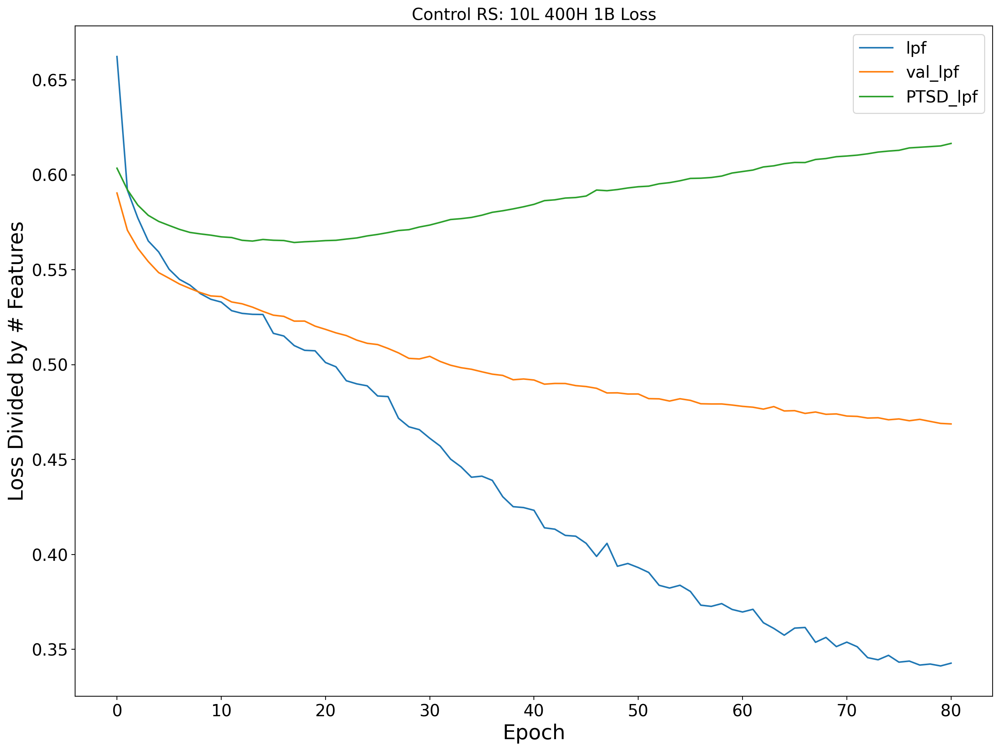

In [3]:
type_list = ["RS"]
latent_nums = [10]
hidden_nums = [400]
betas = [1]
for type_name in type_list:
    for latent_num in latent_nums:
        for hidden_num in hidden_nums:
            for beta in betas:
                # Need to make sure that the net name matches the name of the net you trained
                net_name = 'control_{}_l{}_h{}_b{}_test'.format(type_name, latent_num, hidden_num, beta)
                plot_title = "{} {}: {}L {}H {}B Loss".format("Control", type_name, latent_num, hidden_num, beta)
                stat_label_dict = {'loss_per_feature' : 'lpf', 
                                   'validation_loss_per_feature' : ['val_lpf', "{}_lpf".format("PTSD")]}
                save_name = "{}_{}L_{}H_{}B_loss.png".format(type_name, latent_num, hidden_num, beta)
                plot_loss(net_name, plot_title, stat_label_dict, save_name)

## Plotting Individual Latents for RS Example

Reading latents from  C:\Users\Orren\Documents\Columbia\GitHub\OriginalGitHub\MultimodalPTSDClassification\code\vae_nets\control_RS_l10_h400_b1_test\control_RS_l10_h400_b1_test_both_latents.csv


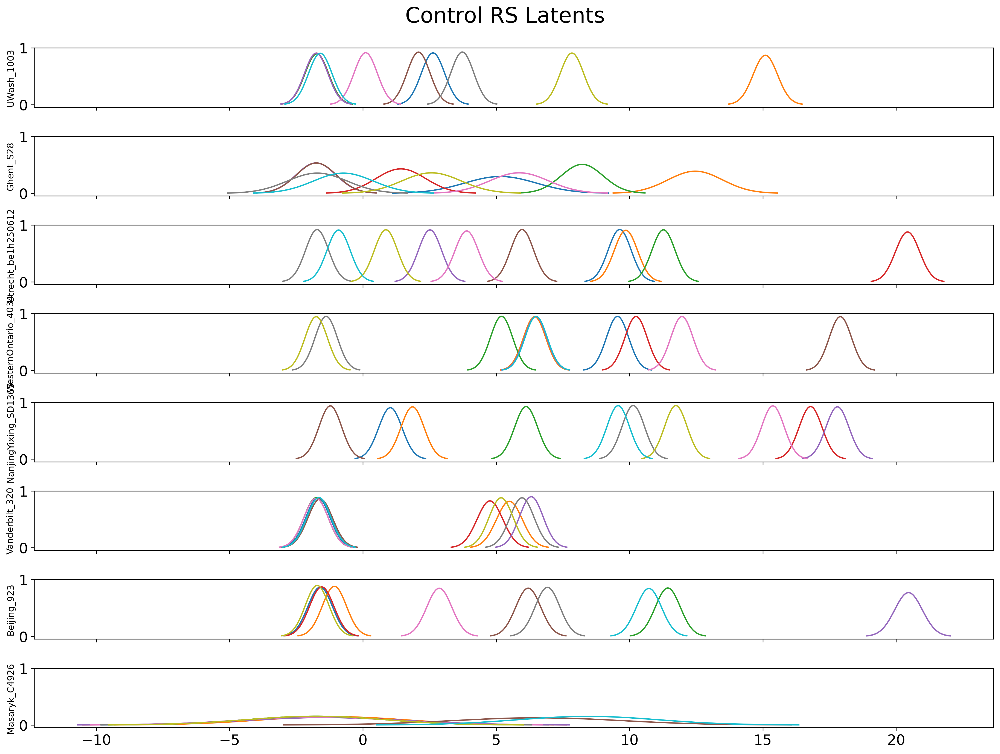

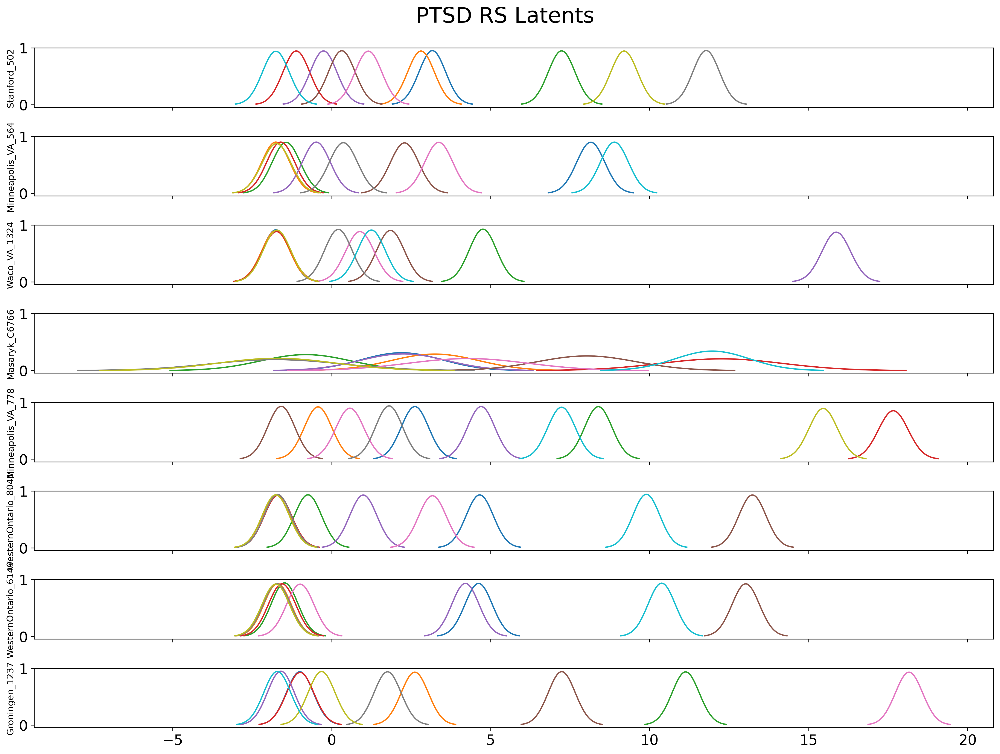

Reading latents from  C:\Users\Orren\Documents\Columbia\GitHub\OriginalGitHub\MultimodalPTSDClassification\code\vae_nets\control_RS_l10_h400_b1_test\control_RS_l10_h400_b1_test_both_latents.csv


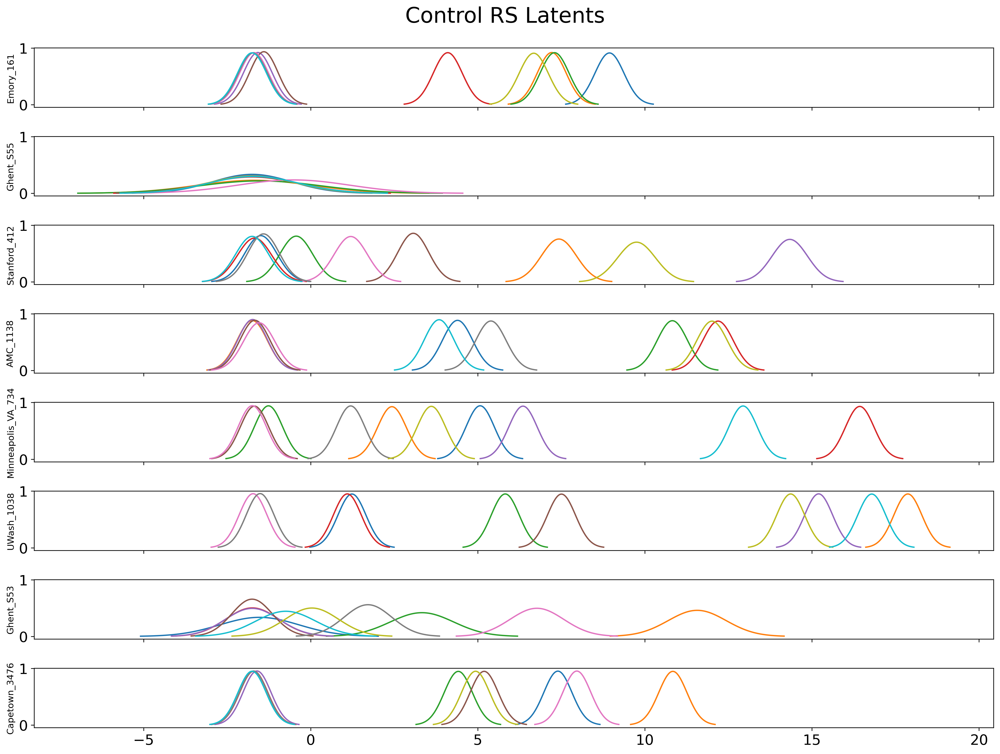

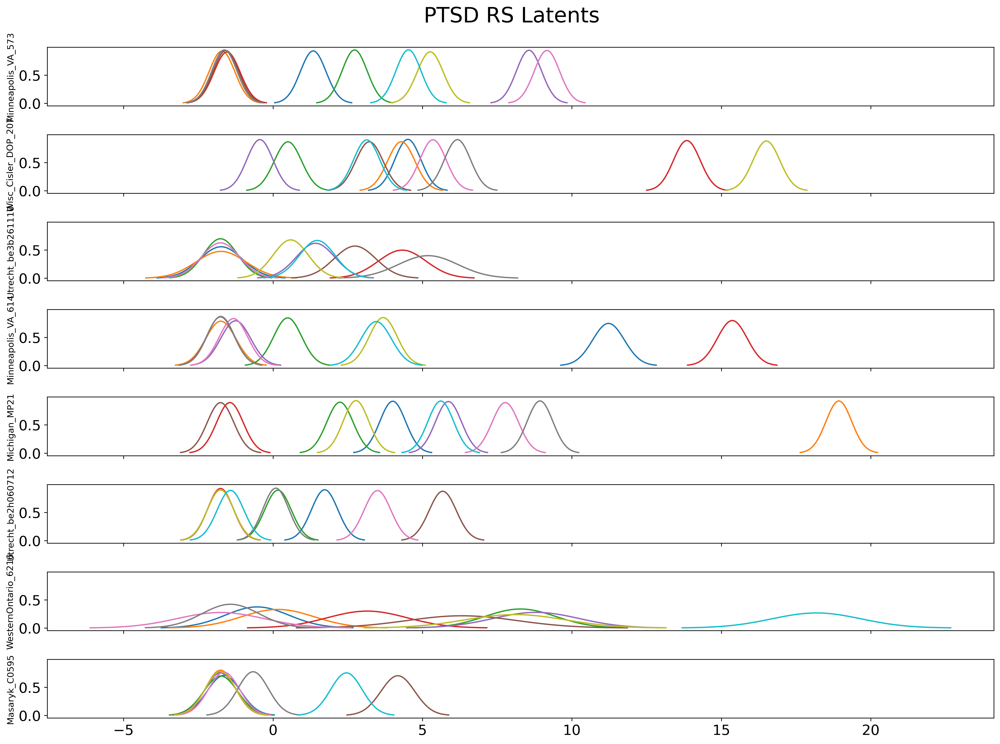

Reading latents from  C:\Users\Orren\Documents\Columbia\GitHub\OriginalGitHub\MultimodalPTSDClassification\code\vae_nets\control_RS_l10_h400_b1_test\control_RS_l10_h400_b1_test_both_latents.csv


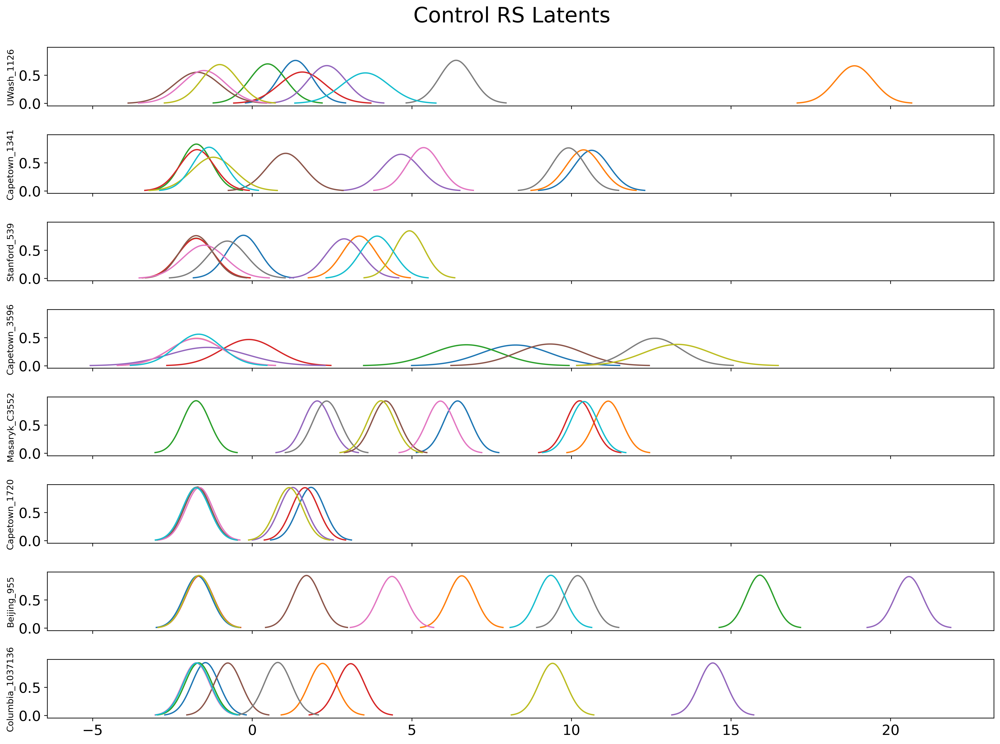

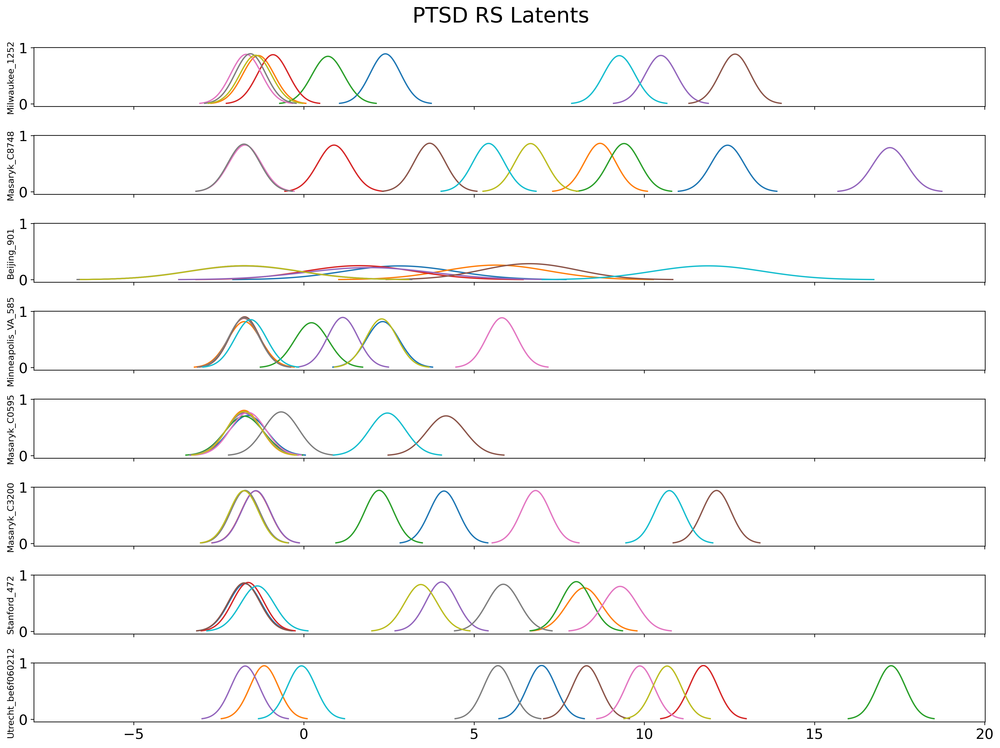

In [6]:
diagnoses = ['Control', 'PTSD']
type_list = ["RS"]
latent_nums = [10]
hidden_nums = [400]
betas = [1]

for type_name in type_list:
    for latent_num in latent_nums:
        for hidden_num in hidden_nums:
            for beta in betas:
                # Need to make sure that the net name matches the name of the net you trained
                net_name = 'control_{}_l{}_h{}_b{}_test'.format(type_name, latent_num, hidden_num, beta)
                for run in range(3):
                    df = load_latents(net_name, fname_tag='both')
                    for diagnosis in diagnoses:
                        plot_latent_individual(df, type_name='RS', n_choices=8, diagnosis=diagnosis, sharex=True, 
                                               sharey=True, run_id=run)

## Plotting Average Latents Over Site RS Example

Reading latents from  C:\Users\Orren\Documents\Columbia\GitHub\OriginalGitHub\MultimodalPTSDClassification\code\vae_nets\control_RS_l10_h400_b1_test\control_RS_l10_h400_b1_test_both_latents.csv


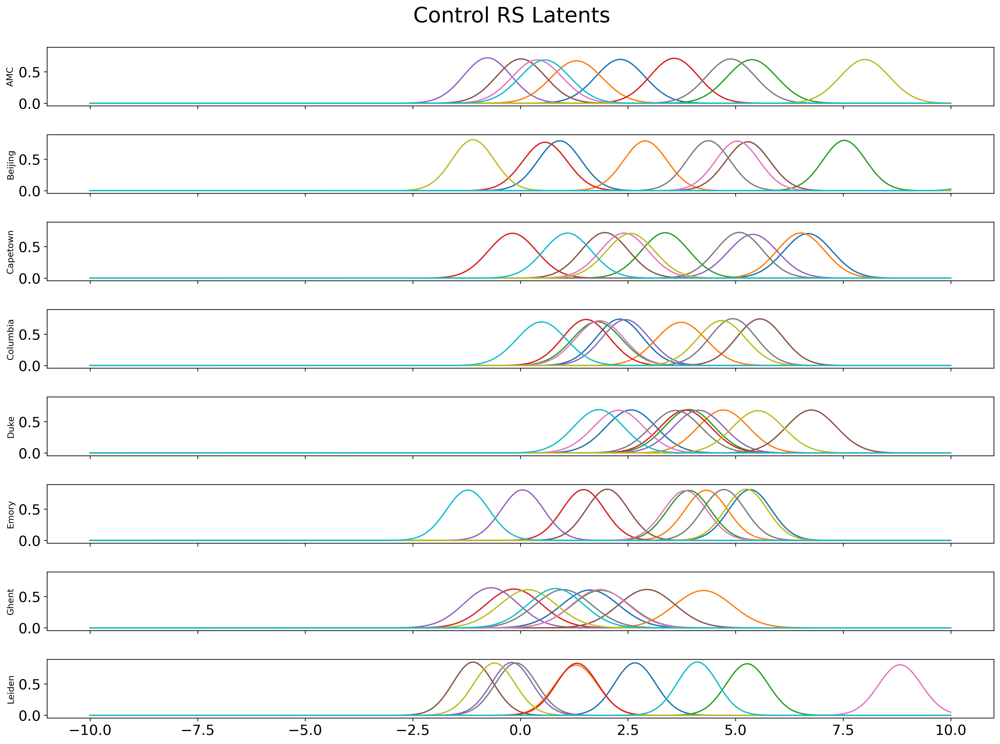

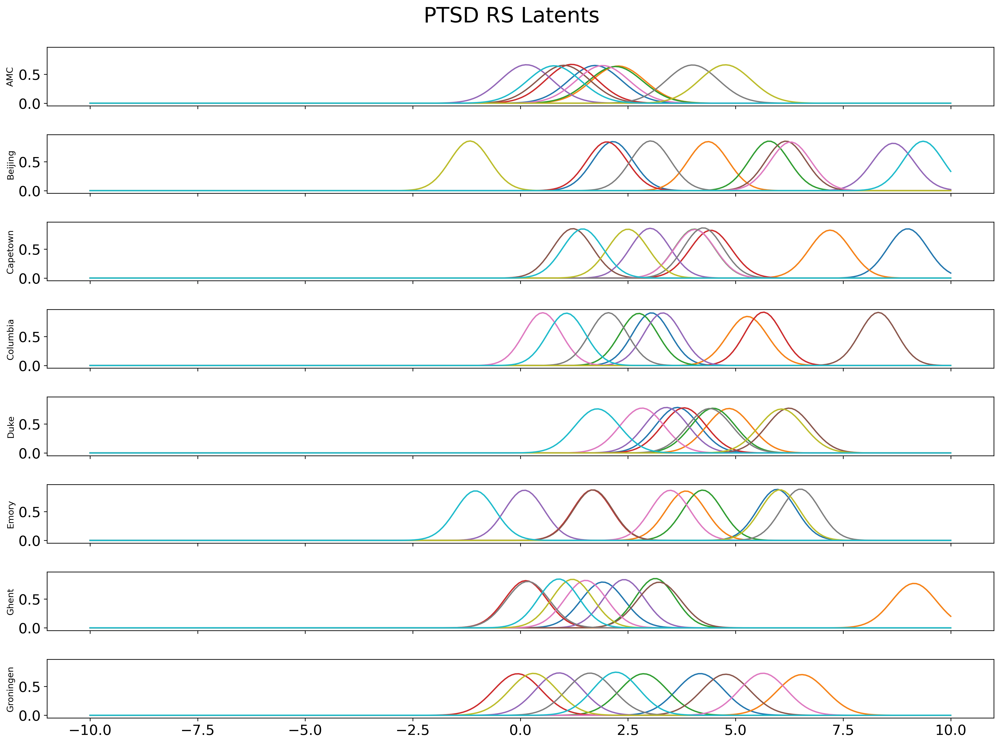

Reading latents from  C:\Users\Orren\Documents\Columbia\GitHub\OriginalGitHub\MultimodalPTSDClassification\code\vae_nets\control_RS_l10_h400_b1_test\control_RS_l10_h400_b1_test_both_latents.csv


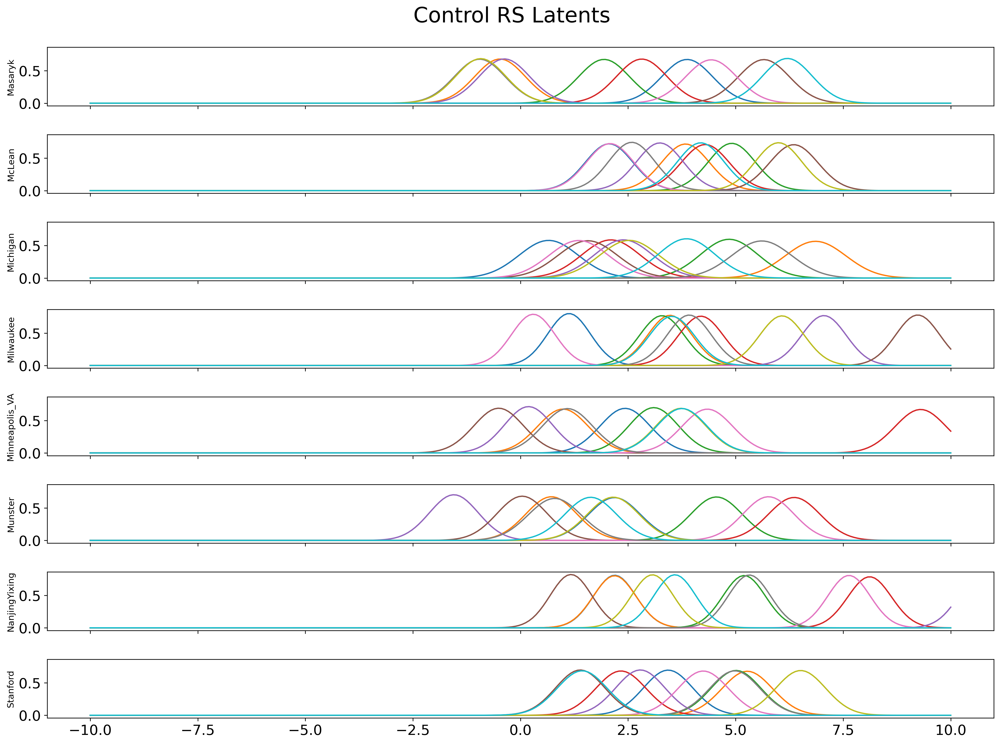

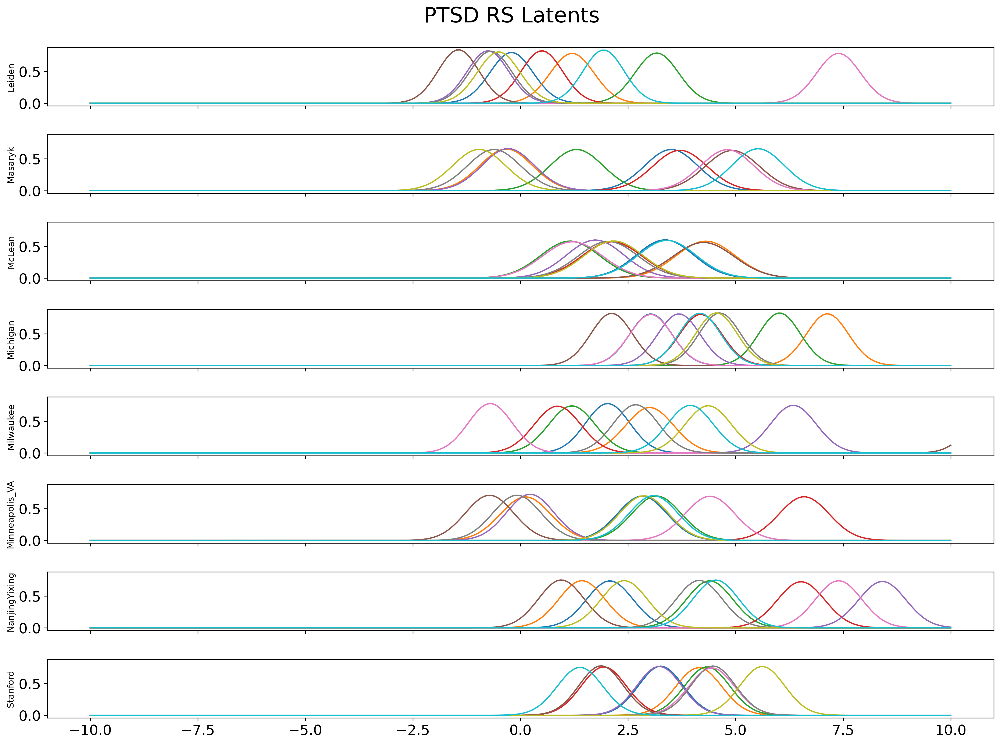

Reading latents from  C:\Users\Orren\Documents\Columbia\GitHub\OriginalGitHub\MultimodalPTSDClassification\code\vae_nets\control_RS_l10_h400_b1_test\control_RS_l10_h400_b1_test_both_latents.csv


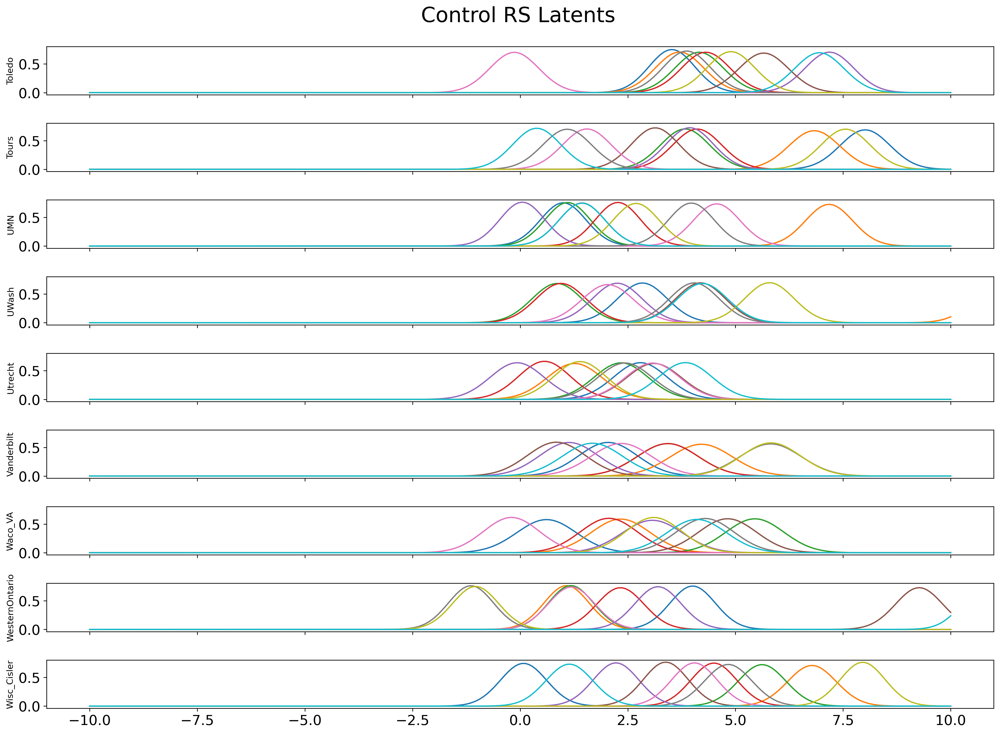

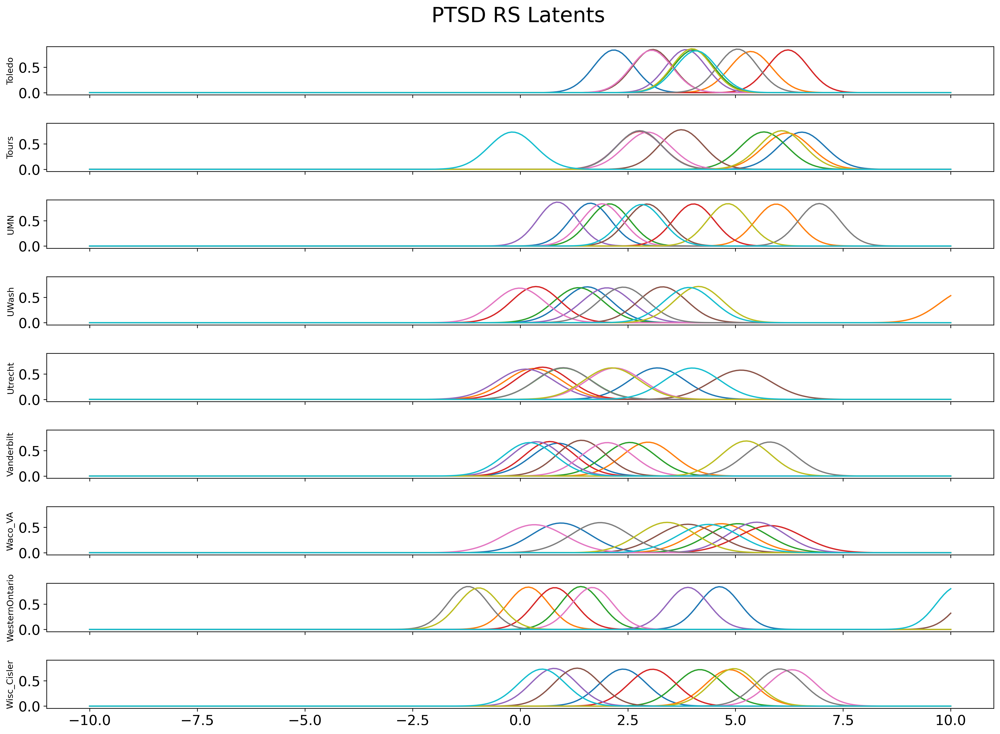

In [8]:
diagnoses = ['Control', 'PTSD']

avg_col = 'Site'

type_list = ["RS"]
latent_nums = [10]
hidden_nums = [400]
betas = [1]
num_runs = 3
for type_name in type_list:
    for latent_num in latent_nums:
        for hidden_num in hidden_nums:
            for beta in betas:
                # Need to make sure that the net name matches the name of the net you trained
                net_name = 'control_{}_l{}_h{}_b{}_test'.format(type_name, latent_num, hidden_num, beta)
                for run in range(num_runs):
                    df = load_latents(net_name, fname_tag='both')
                    for i, diagnosis in enumerate(diagnoses):
                        site_len = len(df[df['Diagnosis'] == i]['Site'].unique()) - 1
                        choices = list(range(site_len))
                        if run != num_runs - 1:
                            choices = choices[site_len//num_runs*run : site_len//num_runs*(run+1)]
                        else:
                            choices = choices[site_len//num_runs*run :]
                        plot_latent_average(df, type_name='RS', choices=choices, diagnosis=diagnosis, avg_col=avg_col, sharex=True, sharey=True, run_id=run)